# Chapter 3. Decompose oncogenic-activation signature and define transcriptional components

<br>
<div>
    <img src="../media/method_chap2.png" width=2144 height=1041>
</div>

### Analysis overview
In this chapter we will use the KRAS oncogenic signature genes that we generated in chapter 2 and we will decomposed them into non-negative matrix factorization components.

To perfrom this analysis we will use as reference dataset 750 samples from the Broad-Novartis Cancer Cell Line Encyclopedia (CCLE) ([*Barretina et al. 2012*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3320027/)). This dataset, hereafter denoted as $A^{n \times m}$, contains as rows the oncogenic signature genes and  samples representing many instances of the cellular states of interest. 

The decomposition is based on a Non-Negative Matrix Factorization (NMF) algorithm ([*Brunet et al. 2004*](https://www.ncbi.nlm.nih.gov/pubmed/15016911); [*Tamayo et al. 2007*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1838404/)). These transcriptional components represent summaries of the most coherent gene expression patterns, relevant to the KRAS signature genes across the wide variety of cellular states and contexts represented in the reference dataset. The methodology contains the following analysis tasks:


*	*Normalization*. Normalize the input matrix $A^{n \times m}$ by replacing each gene expression entry by its column rank and obtain matrix $A^{n \times m}_{norm}$.


*	*Matrix Factorization.* Perform a standard non-negative matrix factorization (NMF) ([*Brunet et al. 2004*](https://www.ncbi.nlm.nih.gov/pubmed/15016911); [*Tamayo et al. 2007*](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1838404/), [*Cichocki et al. 2008*](http://www.bsp.brain.riken.jp/publications/2007/Cichocki-Zd-Amar_SPMAG.pdf))

<div>
    <img src="../media/chap3_equation.png" width=200 height=50>
</div>

*    The resulting matrices $W^{n \times k}$ and $H^{k \times m}$ have lower rank than the original matrix $A^{n \times m}_{norm}$ with $k << n, m$.


*	*Model selection.* Find an optimal number of components $k_{c}$ based on the numerical stability of multiple projections using different random seeds  ([*Brunet et al. 2004*](https://www.ncbi.nlm.nih.gov/pubmed/15016911)). The peaks of the cophenetic coefficient represent the more stable decompositions. 


The Matrix $H^{k \times m}$ has the same number of samples as $A^{n \times m}$ but a smaller number of rows and can be interpreted as a summarized version of the original dataset, i.e., one described in the space of the most salient transcriptional programs (components) rather than the original variables (genes). In the KRAS analysis performed below this procedure will produce 9 transcriptional components C1-C9. Restricting the decomposition process to operate using only the signature genes allowed us to emphasize the most relevant oncogene-driven transcriptional space and limit the effects of other transcriptional differences.


### 1. Set up notebook and import [CCAL](https://github.com/KwatME/ccal)

In [1]:
from notebook_environment import *
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

%load_ext autoreload
%autoreload 2
%matplotlib inline

### 2. Select KRAS signature gene rows from reference dataset (CCLE gene expression)

In [2]:
# Load CCLE object
with gzip.open('../data/ccle.pickle.gz') as f:
    CCLE = pickle.load(f)

In [5]:
# Load kras signature genes file
kras_relevant_genes = pd.read_table(
    'downgenes.txt', squeeze=True)

# Select kras signature gene rows from CCLE gene expression
rpkm__kras_relevant_gene_x_ccle_cellline = CCLE['Gene Expression']['df'].loc[
    kras_relevant_genes, :]

# Print CCLE gene expression of kras signature genes
rpkm__kras_relevant_gene_x_ccle_cellline

,A101D_SKIN,A172_CENTRAL_NERVOUS_SYSTEM,A204_SOFT_TISSUE,A2058_SKIN,A2780_OVARY,A375_SKIN,A498_KIDNEY,A549_LUNG,A673_BONE,A704_KIDNEY,...,WM88_SKIN,WM983B_SKIN,YAPC_PANCREAS,YD10B_UPPER_AERODIGESTIVE_TRACT,YD38_UPPER_AERODIGESTIVE_TRACT,YD8_UPPER_AERODIGESTIVE_TRACT,YH13_CENTRAL_NERVOUS_SYSTEM,YKG1_CENTRAL_NERVOUS_SYSTEM,ZR751_BREAST,ZR7530_BREAST
Name,,,,,,,,,,,,,,,,,,,,,
TBK1,15.328074,10.699435,12.080870,12.114392,14.256874,13.672194,10.125029,22.230917,8.549996,23.327742,...,10.544677,12.357136,13.715971,8.916265,14.720596,11.268402,12.981798,13.408736,38.134819,11.288232
AGO2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ATG10,1.373473,2.095980,2.652373,1.994229,3.107289,1.732409,1.285403,2.237346,3.354448,3.638963,...,2.344051,1.289980,1.900433,0.665834,1.157126,1.938212,1.381004,1.813466,2.215588,1.227441
RNF31,13.163423,6.662954,16.092058,14.315384,14.384070,7.303915,6.533099,5.638559,9.858050,6.822289,...,12.973005,10.763466,14.546054,10.460589,12.805510,23.561455,8.522119,6.138366,12.291125,11.937157
UBE2N,39.715351,23.135113,35.153118,37.188396,31.443373,36.715366,14.476606,33.628918,24.006653,33.281288,...,33.119022,23.038019,28.756964,16.375353,29.939512,23.379900,19.349731,19.922630,33.007488,28.587084
CHMP3,16.082071,24.496758,14.054204,13.654612,9.630249,13.462067,26.522181,27.671003,17.398930,19.560192,...,17.361612,22.581938,32.986317,19.747141,19.992483,22.720903,19.363035,19.925682,30.964134,20.255863
TRAF2,8.630407,14.583055,7.650213,12.164270,8.585279,7.208685,12.863435,16.386057,8.127201,5.242802,...,6.495252,16.981369,12.780611,9.684458,12.922576,5.340308,6.979433,5.400553,9.824999,7.107501
SCAF4,8.866841,12.336237,15.258432,11.962676,24.489435,9.738522,11.380835,7.925826,16.722820,5.276367,...,10.581116,16.616600,14.252038,6.366451,12.383436,9.073178,11.451228,15.484377,5.887475,8.837029
STUB1,55.869747,35.590649,32.608246,62.754158,29.186274,58.880611,47.400681,17.143444,35.721703,60.291348,...,71.730659,27.585999,9.201369,24.809280,26.469601,37.887859,39.456242,41.106335,73.780731,41.144863


### 3. Clean up filtered reference dataset

In [6]:
# Drop columns with only 1 unique object
df = ccal.drop_df_slices(
    rpkm__kras_relevant_gene_x_ccle_cellline, 0, max_n_unique_objects=1)

# Drop rows with only 1 unique object
df = ccal.drop_df_slices(df, 1, max_n_unique_objects=1)

# Rank normalize
array_2d = ccal.normalize_2d_array(df.values, 'rank', axis=0)

# Scale
array_2d *= 10000

# Convert to DataFrame
rpkm__kras_relevant_gene_x_ccle_cellline = pd.DataFrame(
    array_2d, index=df.index, columns=df.columns)
rownm = list(df.index)

Dropping 0 axis-0 slices ...
Dropping 28 axis-1 slices ...


### 4. Generate NMF decompositions of filtered reference dataset

Here we'll explore NMF decompositions ranging from 2 to 12 components.

NMFCC with K = 2 ...
	K = 2: 1/30 ...
NMFCC with K = 3 ...
	K = 3: 1/30 ...
NMFCC with K = 5 ...
NMFCC with K = 4 ...
	K = 5: 1/30 ...
NMFCC with K = 6 ...
	K = 6: 1/30 ...
	K = 4: 1/30 ...
NMFCC with K = 7 ...
	K = 7: 1/30 ...
NMFCC with K = 8 ...
	K = 8: 1/30 ...
NMFCC with K = 9 ...
	K = 9: 1/30 ...
NMFCC with K = 10 ...
	K = 10: 1/30 ...
	K = 2: 11/30 ...
	K = 3: 11/30 ...
	K = 4: 11/30 ...
	K = 5: 11/30 ...
	K = 6: 11/30 ...
	K = 7: 11/30 ...
	K = 2: 21/30 ...
	K = 8: 11/30 ...
	K = 9: 11/30 ...
	K = 3: 21/30 ...
	K = 10: 11/30 ...
	K = 4: 21/30 ...
	K = 5: 21/30 ...
	K = 2: 30/30 - done.
Created directory /lscratch/home/brendan/oncogps/onco_gps_paper_analysis/output/nmfccs_ccle_down.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

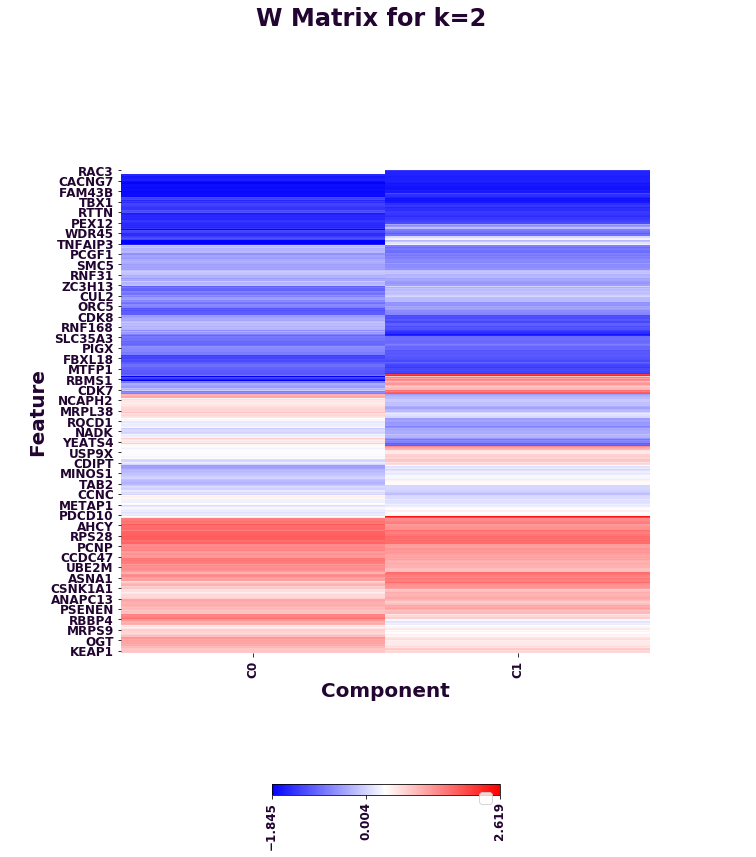

No handles with labels found to put in legend.
No handles with labels found to put in legend.


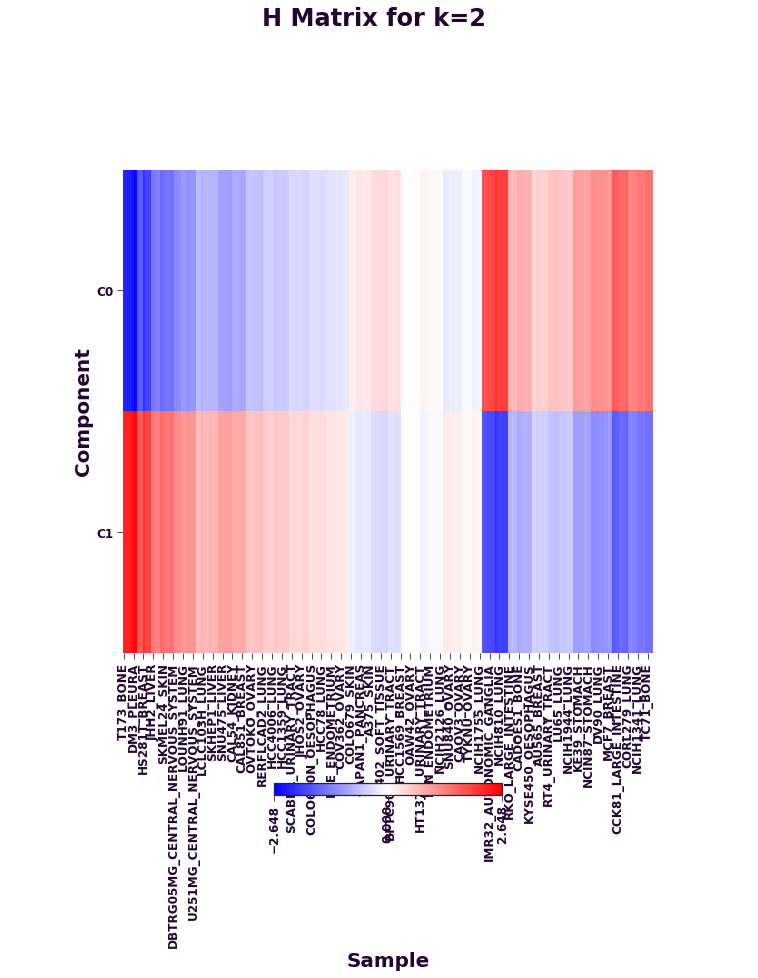

No handles with labels found to put in legend.
No handles with labels found to put in legend.


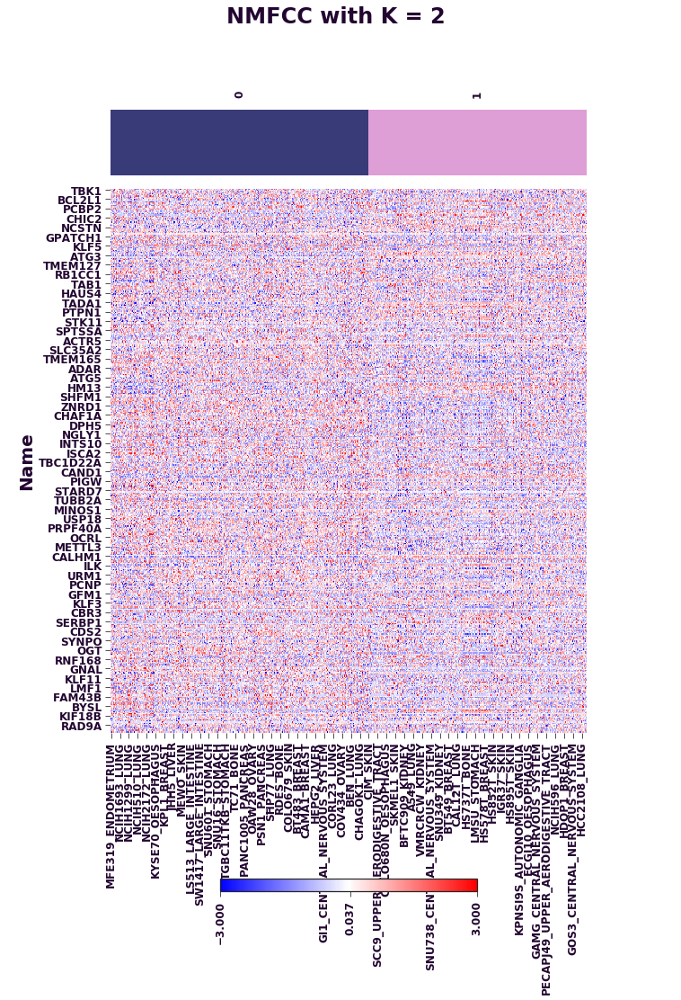

	K = 6: 21/30 ...
	K = 3: 30/30 - done.
	K = 7: 21/30 ...


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

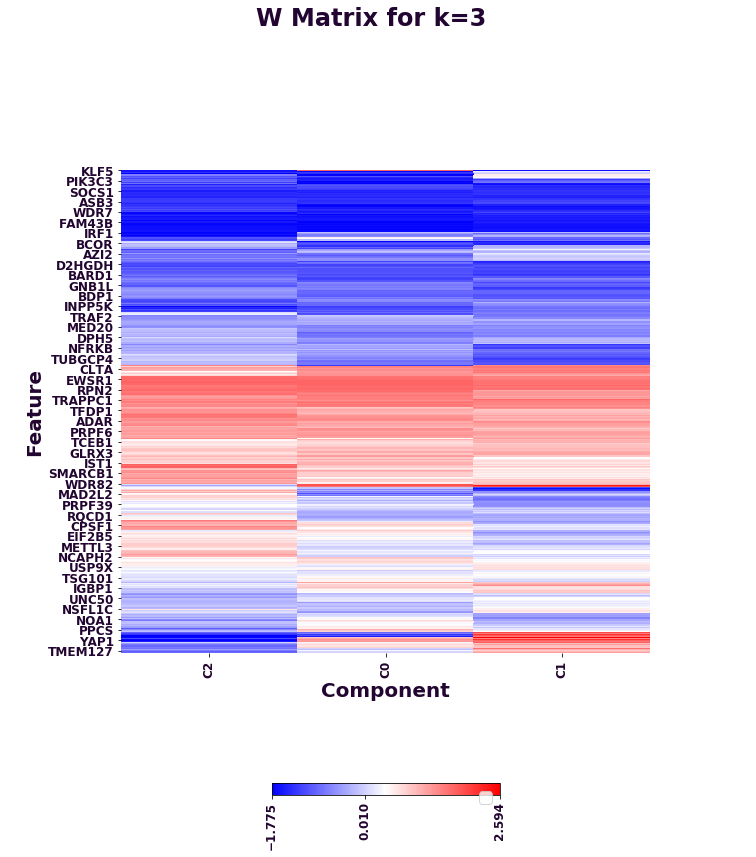

No handles with labels found to put in legend.
No handles with labels found to put in legend.


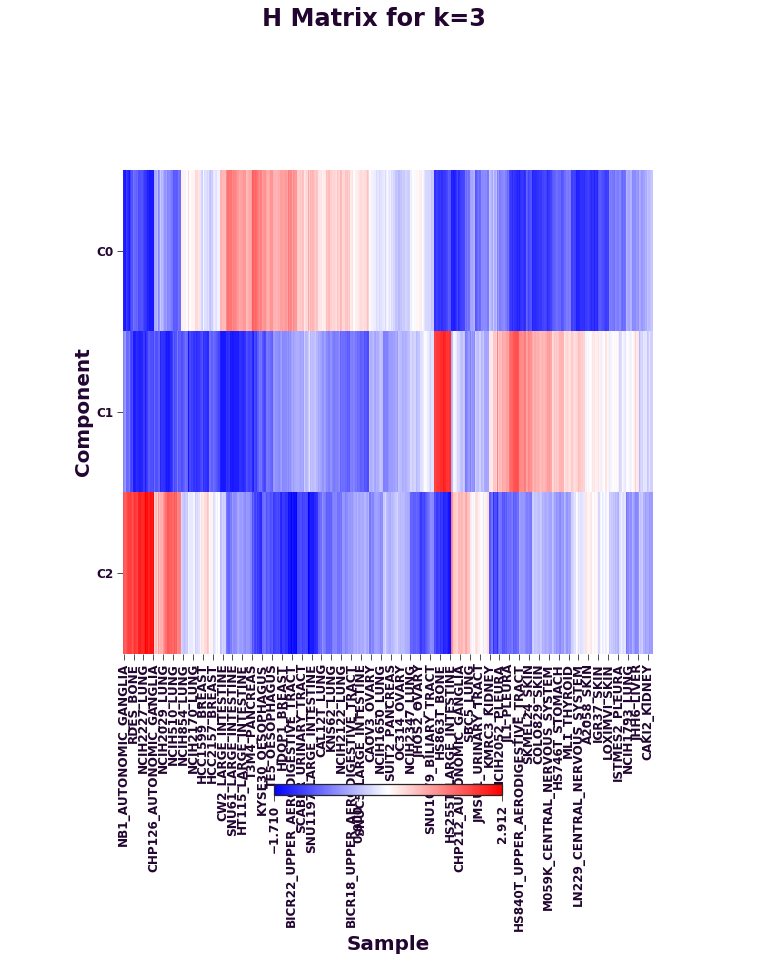

No handles with labels found to put in legend.
No handles with labels found to put in legend.


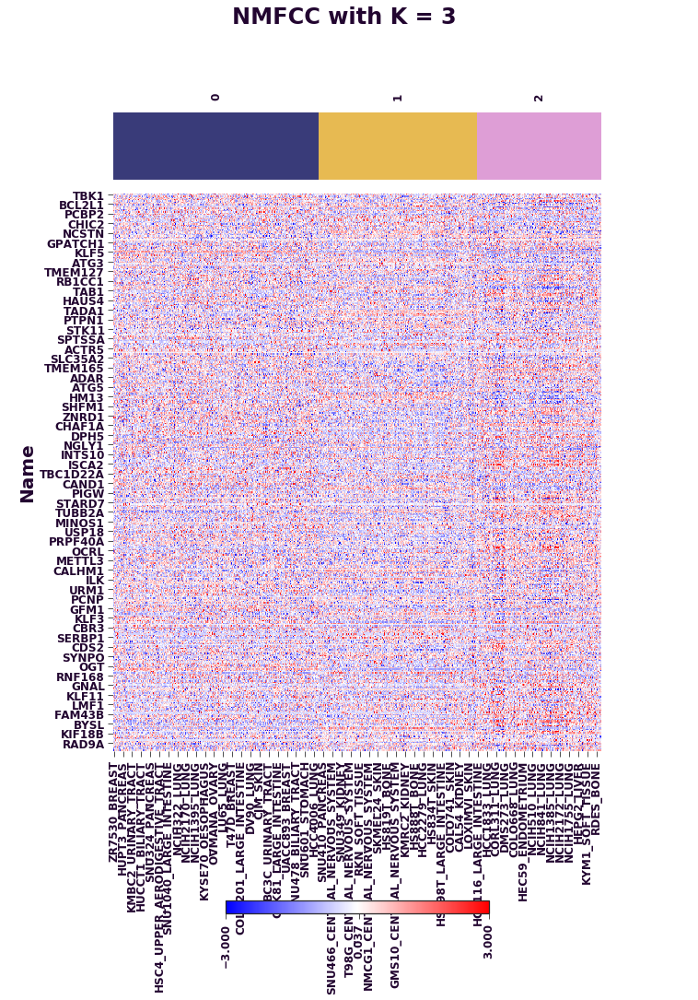

	K = 4: 30/30 - done.
	K = 8: 21/30 ...


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

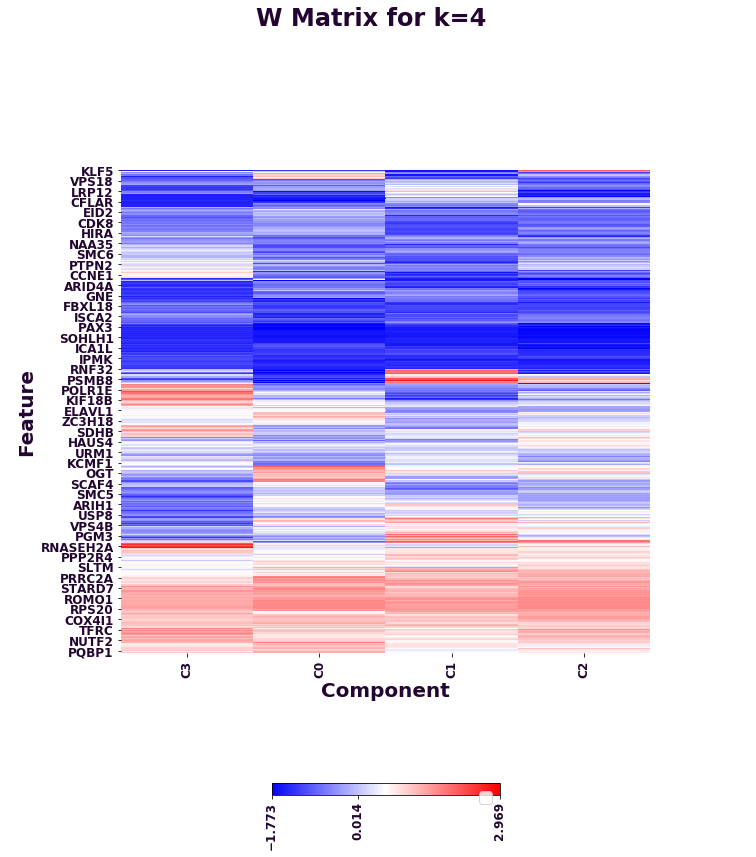

No handles with labels found to put in legend.
No handles with labels found to put in legend.


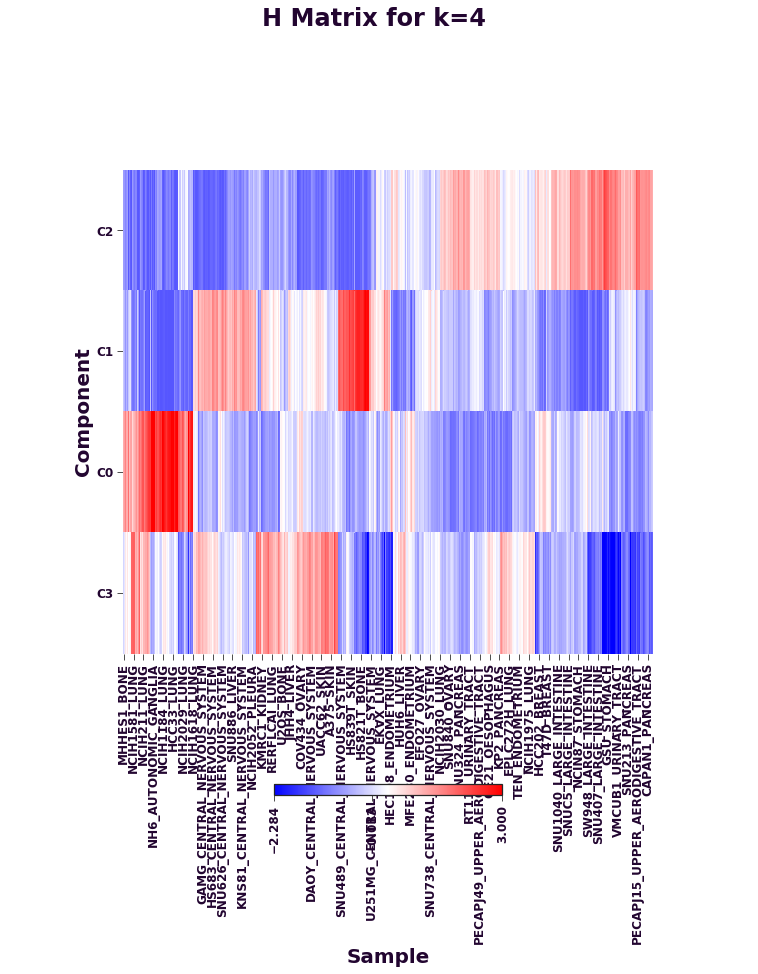

No handles with labels found to put in legend.
No handles with labels found to put in legend.


	K = 5: 30/30 - done.


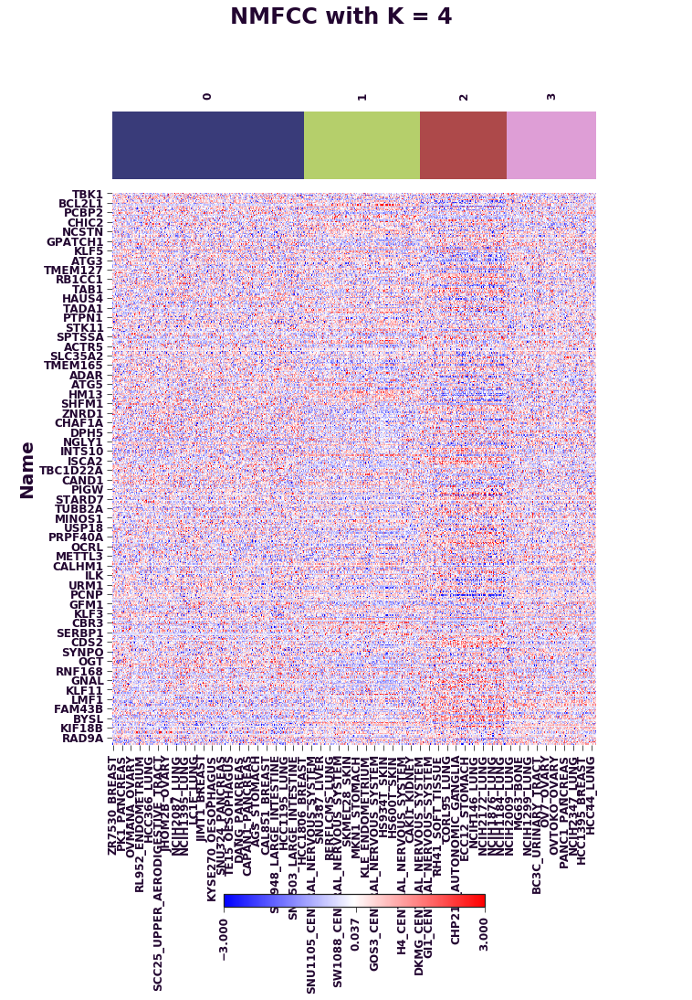

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

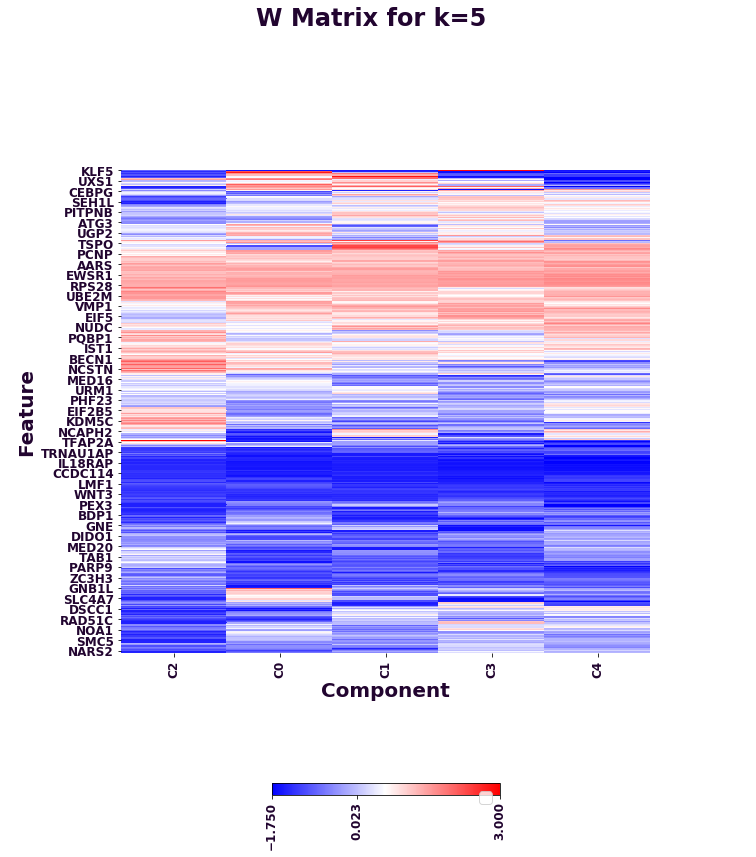

No handles with labels found to put in legend.
No handles with labels found to put in legend.


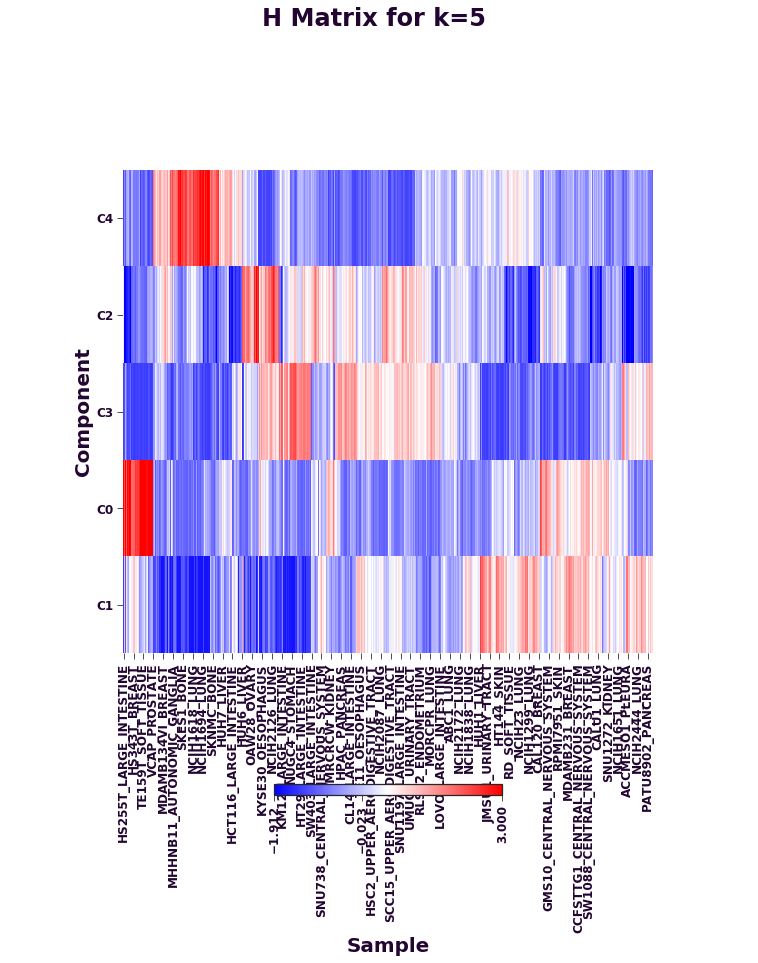

No handles with labels found to put in legend.
No handles with labels found to put in legend.


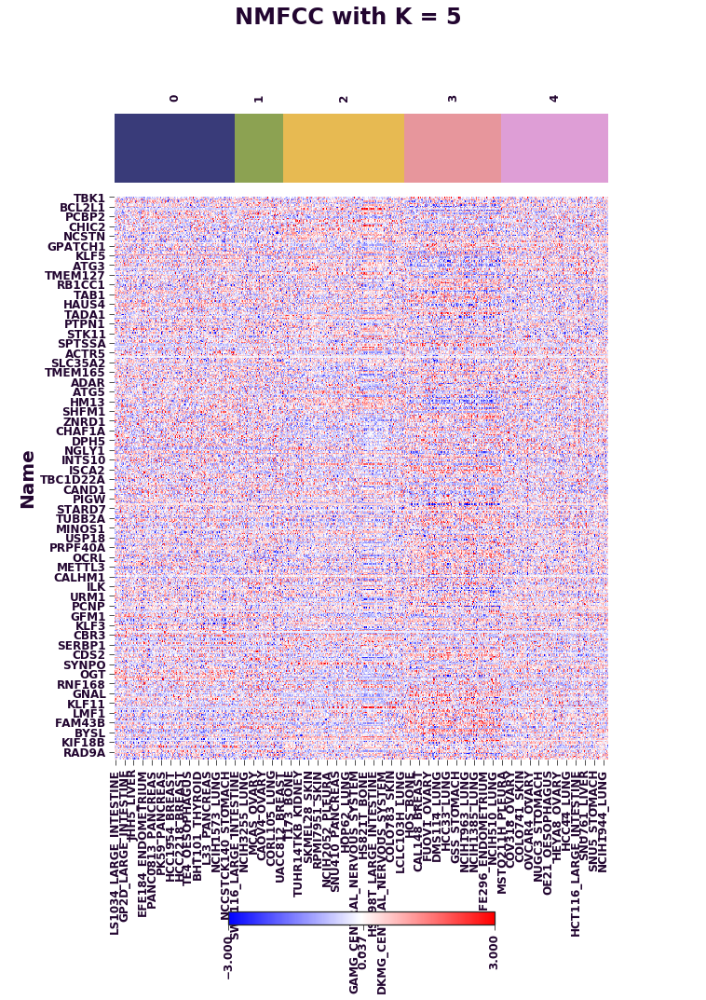

	K = 9: 21/30 ...
	K = 10: 21/30 ...
	K = 6: 30/30 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

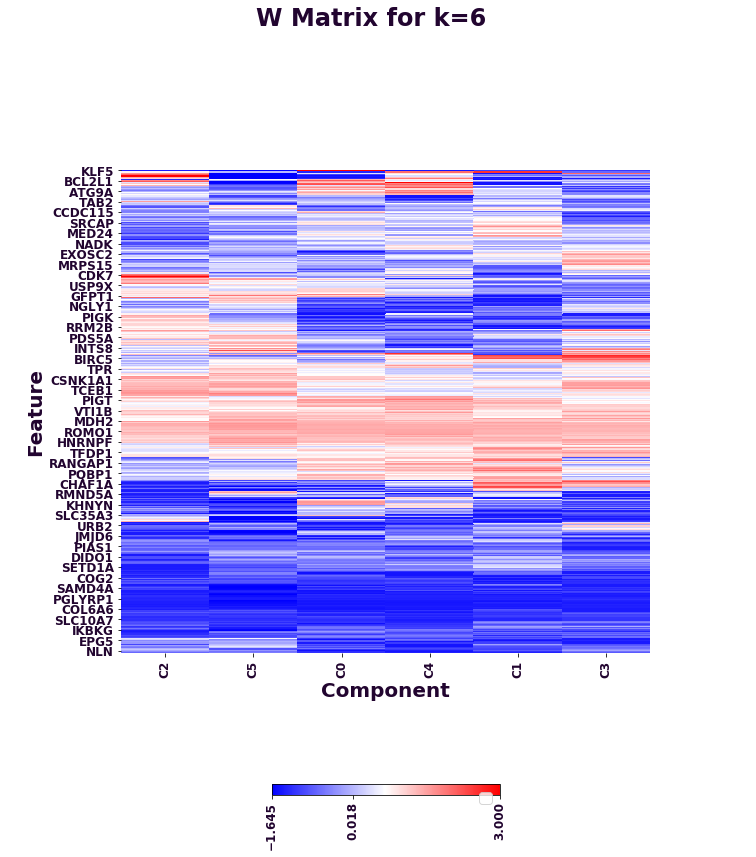

No handles with labels found to put in legend.
No handles with labels found to put in legend.


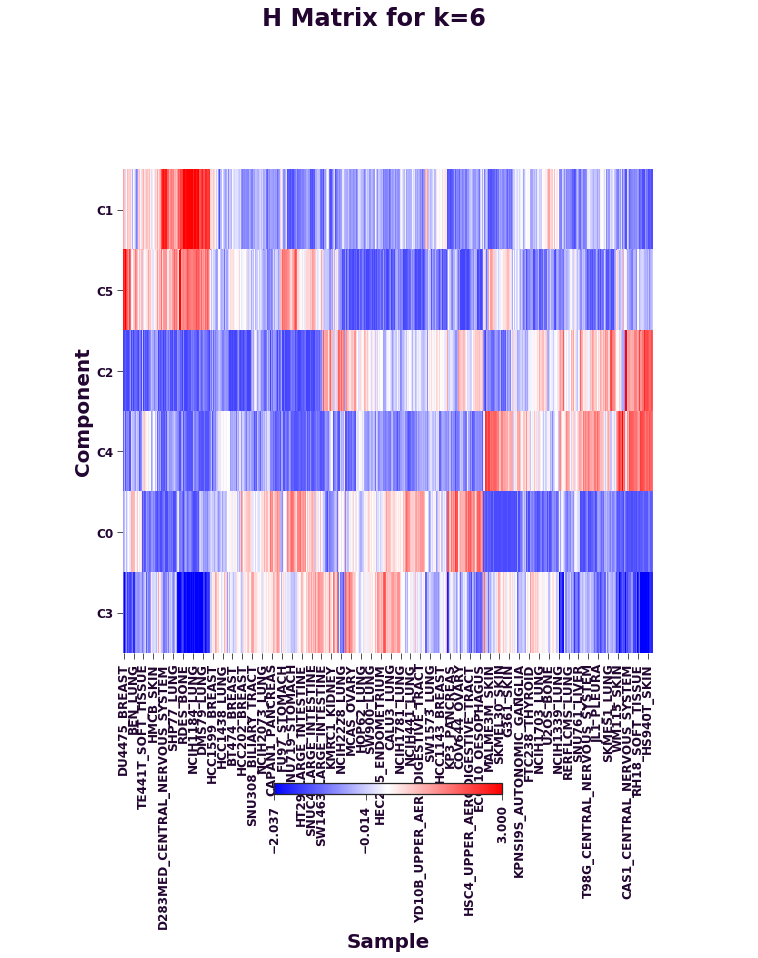

No handles with labels found to put in legend.
No handles with labels found to put in legend.


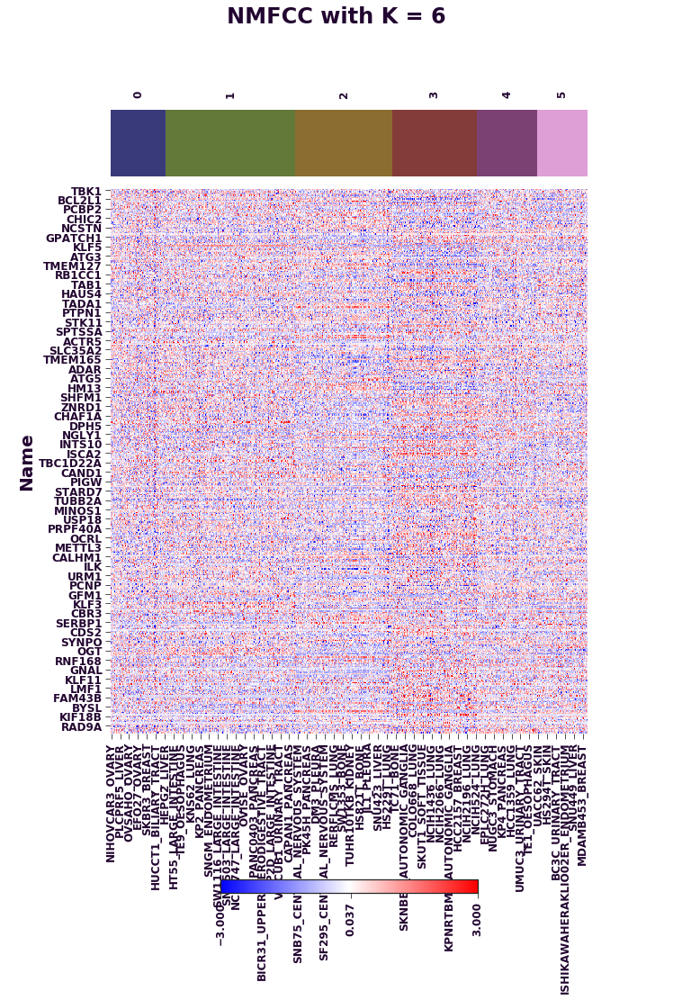

	K = 7: 30/30 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

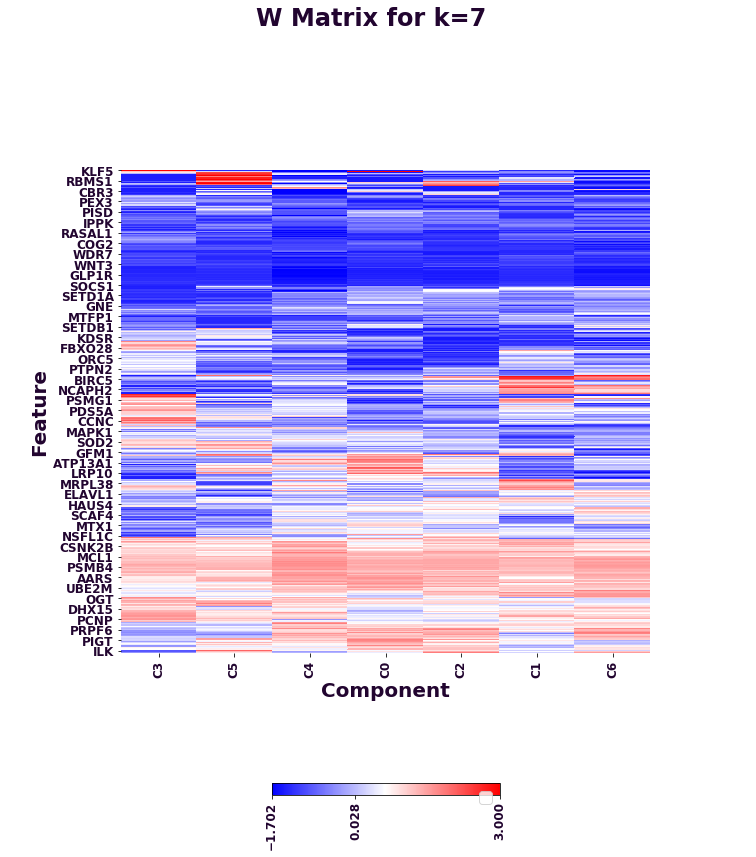

No handles with labels found to put in legend.
No handles with labels found to put in legend.


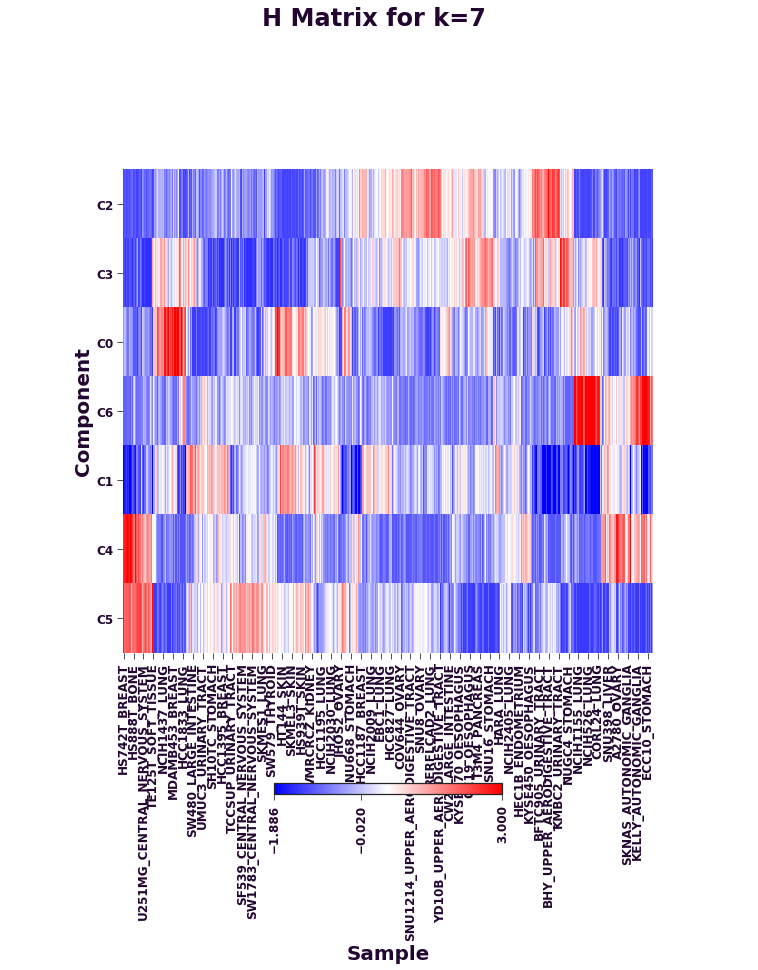

No handles with labels found to put in legend.
No handles with labels found to put in legend.


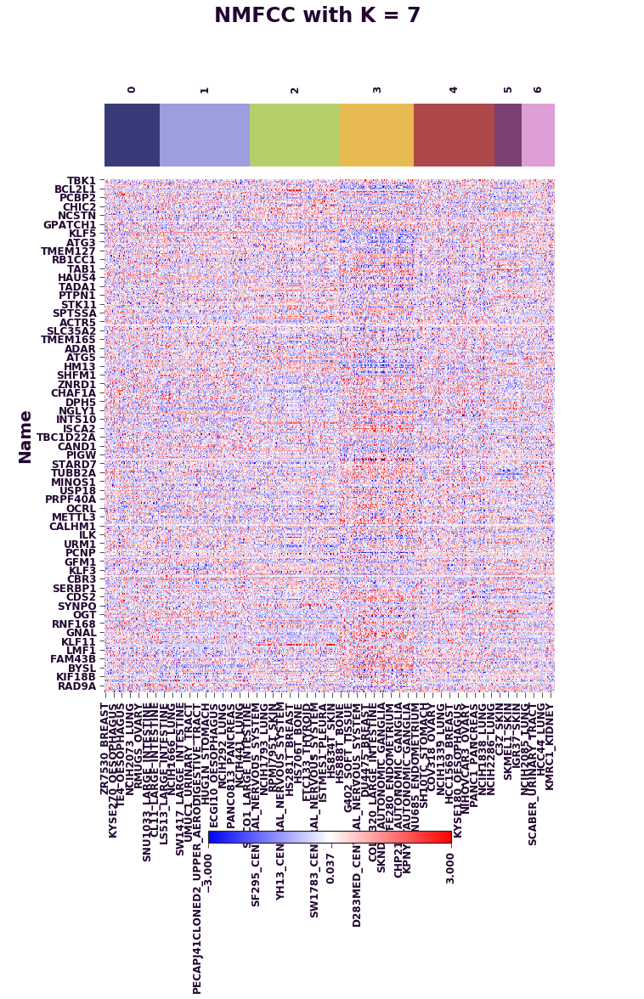

	K = 8: 30/30 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

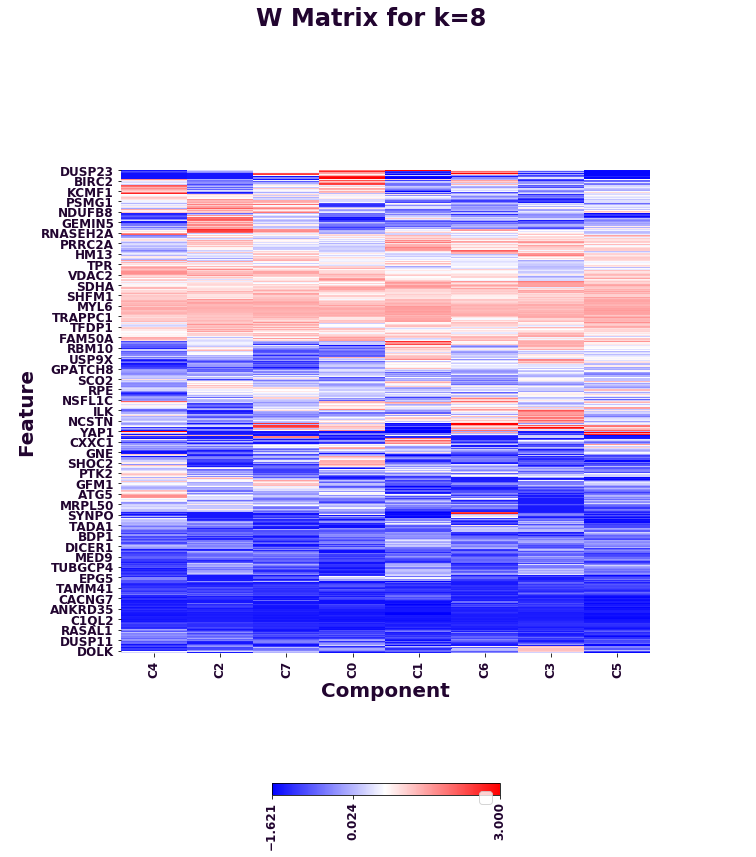

No handles with labels found to put in legend.
No handles with labels found to put in legend.


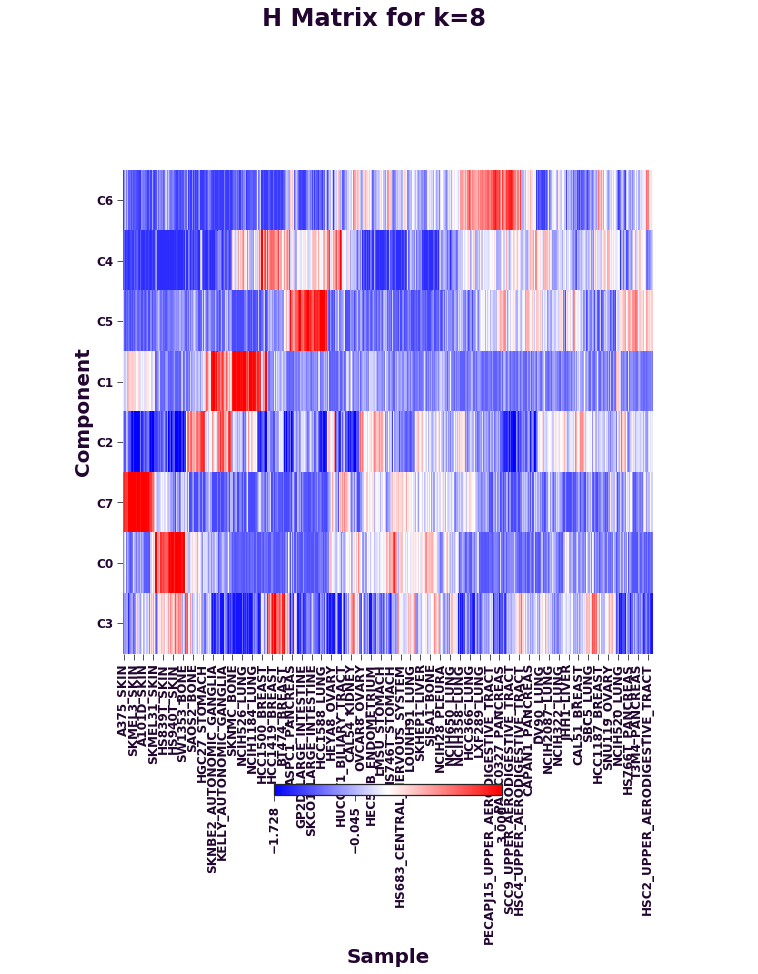

No handles with labels found to put in legend.
No handles with labels found to put in legend.


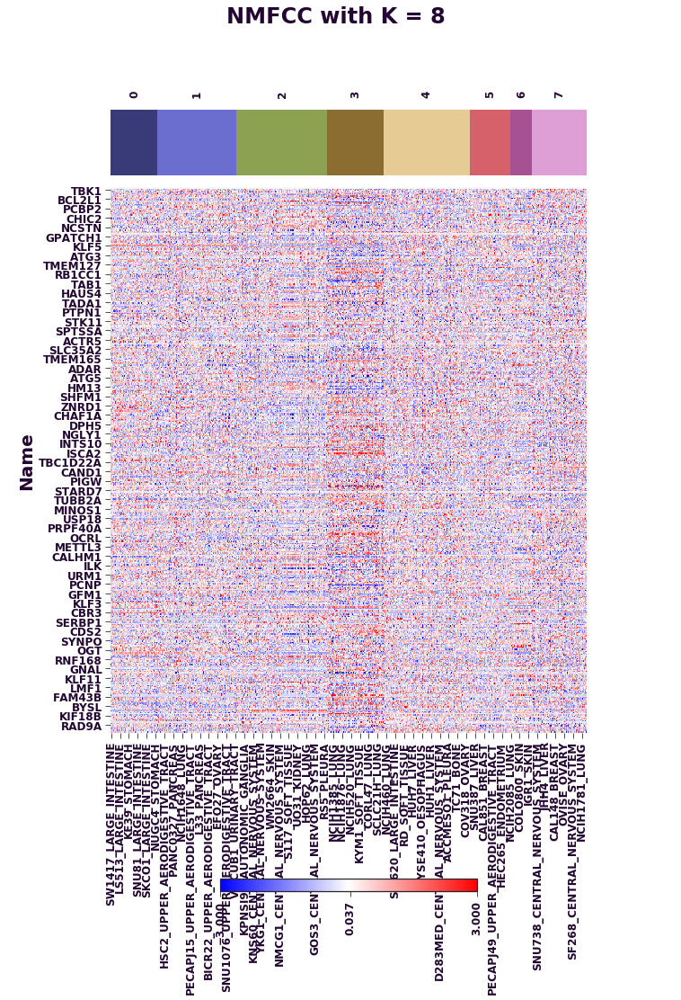

	K = 9: 30/30 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

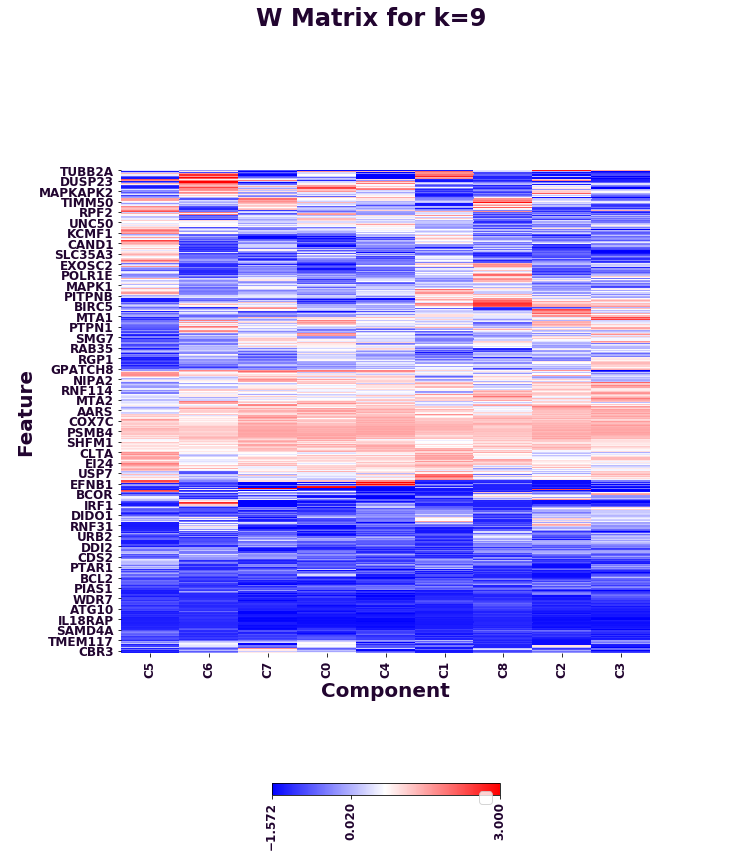

No handles with labels found to put in legend.
No handles with labels found to put in legend.


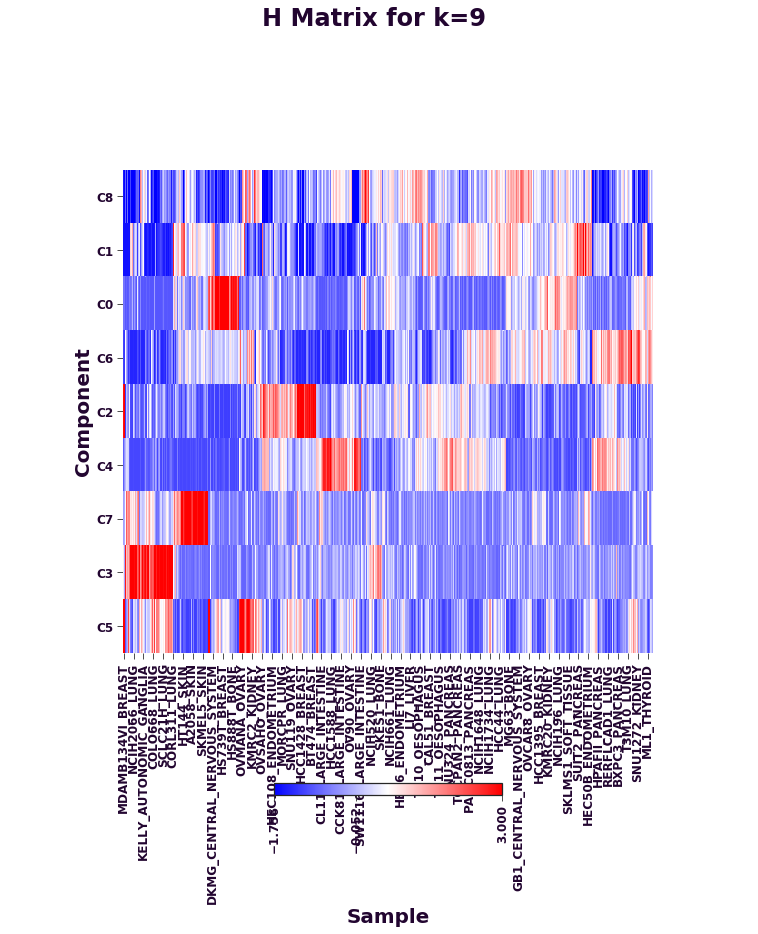

No handles with labels found to put in legend.
No handles with labels found to put in legend.


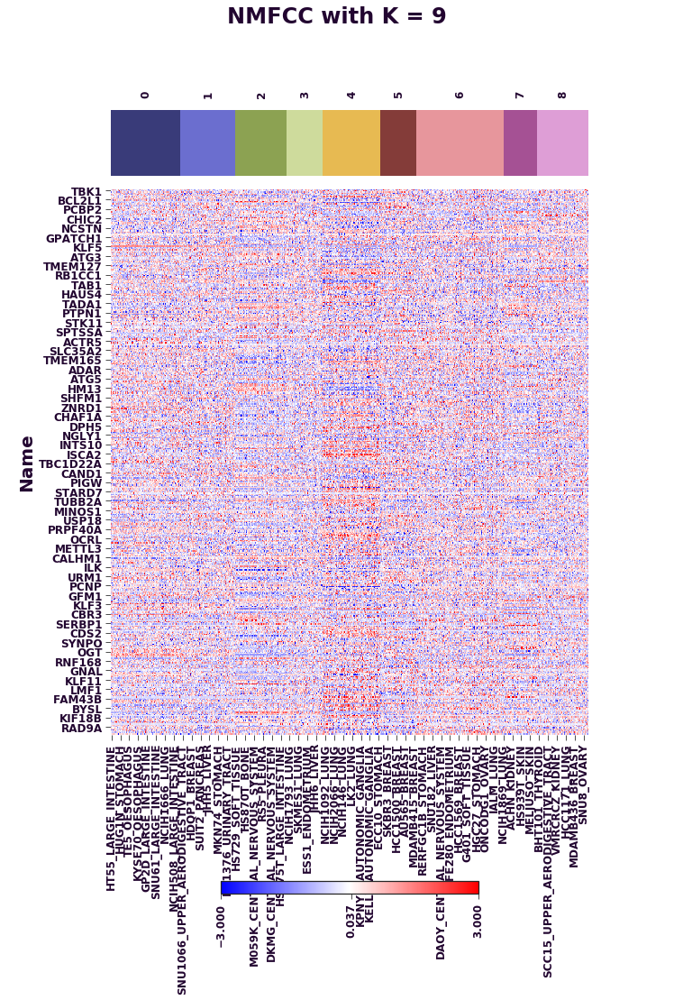

	K = 10: 30/30 - done.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

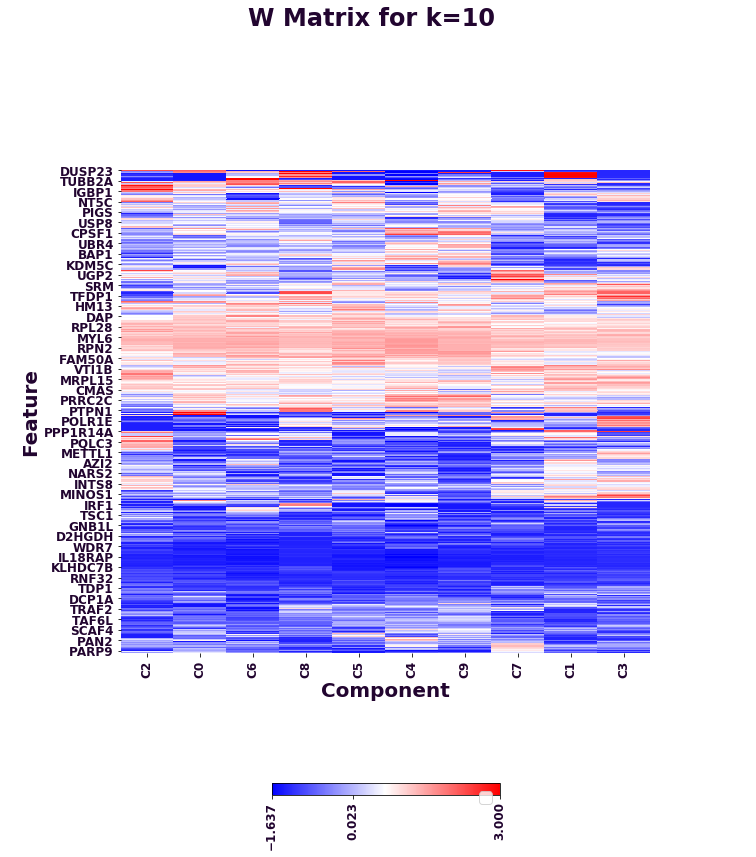

No handles with labels found to put in legend.
No handles with labels found to put in legend.


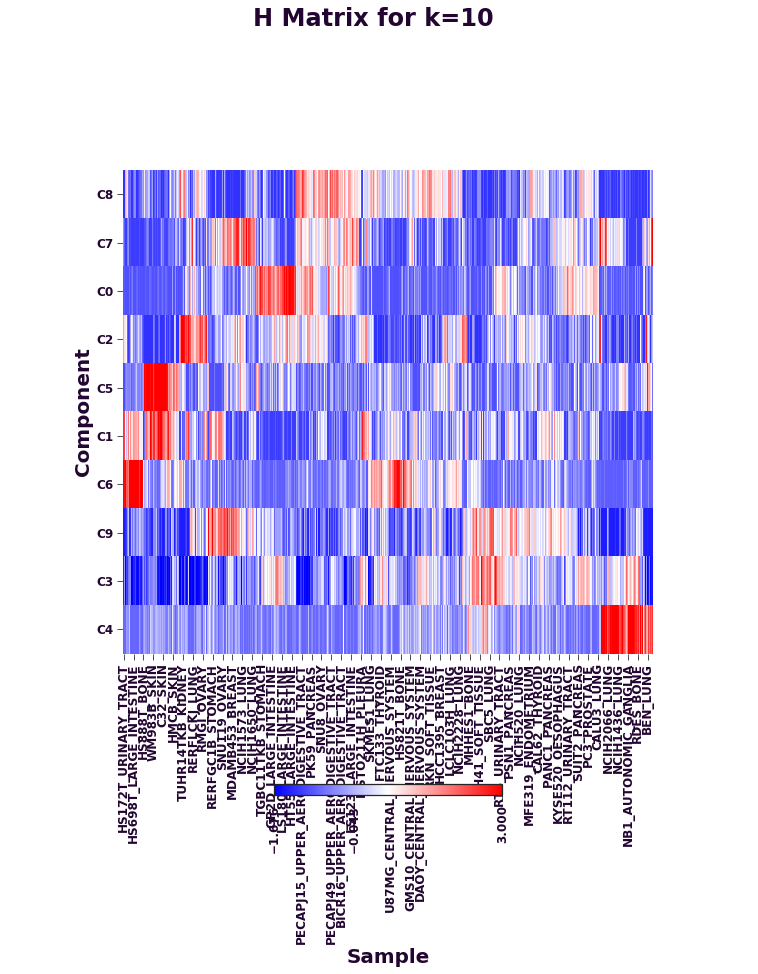

No handles with labels found to put in legend.
No handles with labels found to put in legend.


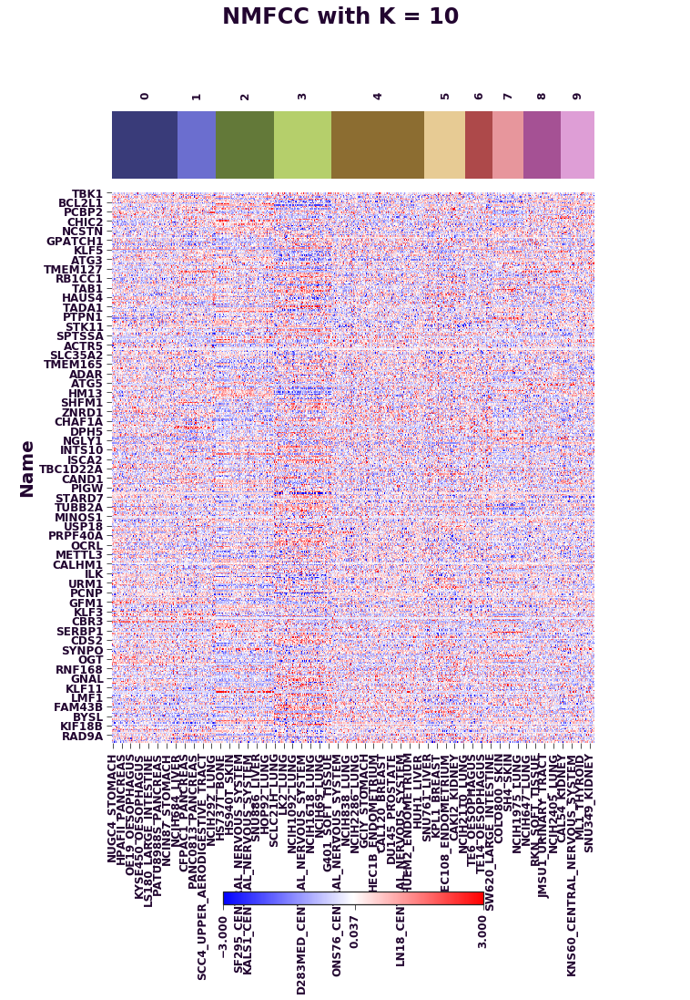

No handles with labels found to put in legend.


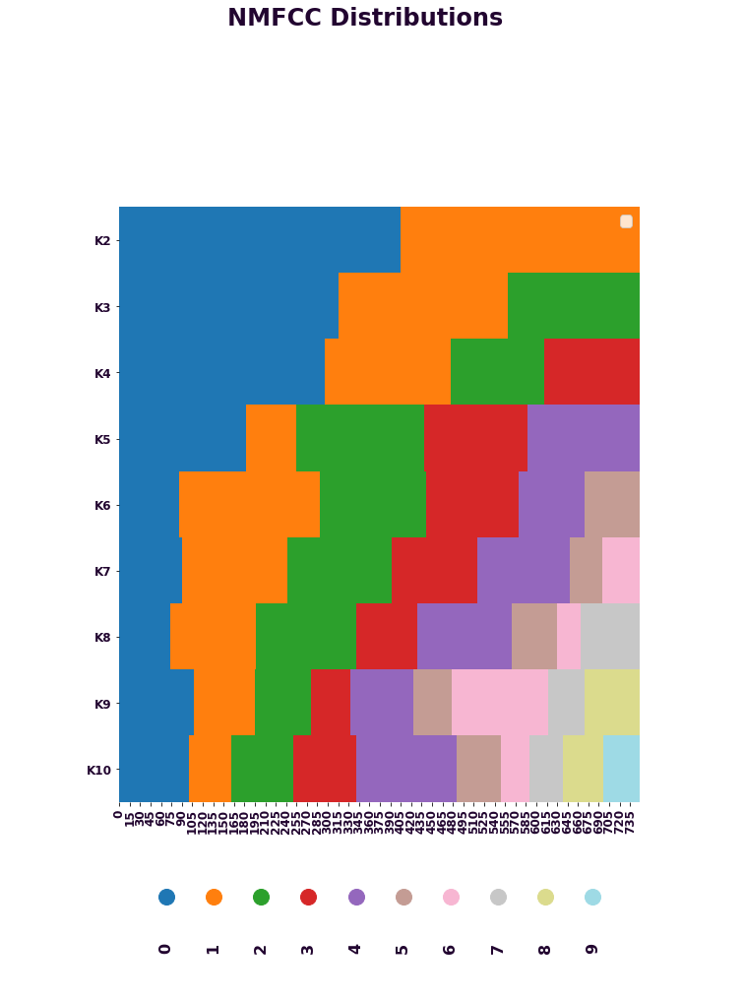

No handles with labels found to put in legend.


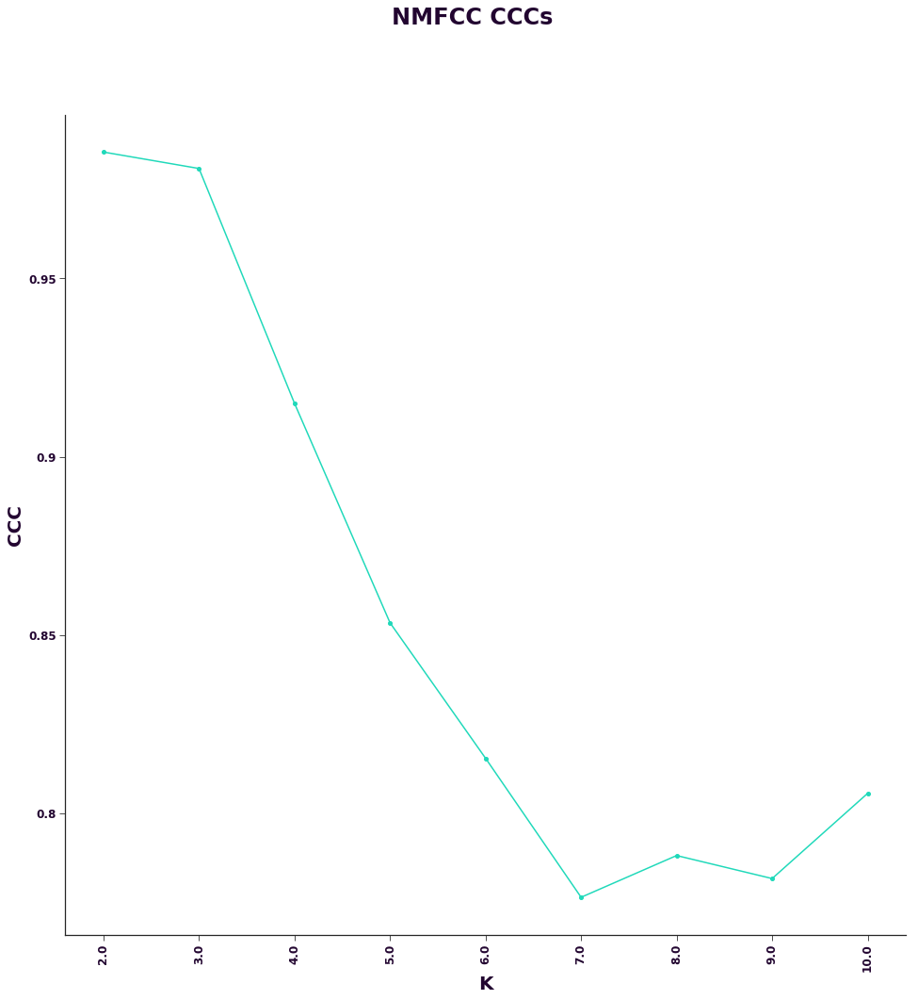

In [6]:
nmfs, nmfccs, cccs = ccal.define_components(
     rpkm__kras_relevant_gene_x_ccle_cellline,
     range(2, 11),
     '../output/nmfccs_ccle_down',
     algorithm='ls',
     n_clusterings=30,
     n_jobs=9,
     random_seed=6137)

### 5. Read H and W matrices of optimal decomposition (k=9) and re-label components

Looking at the results of the prior computation we can see that there is an optimal solution for k= 9 components. So the code below reads the H and W matrices of k=9. Here the components are also relabeled to match the labeling used in the article. The reason for the different labeling is that the original component numbers used in the article were generated using an earlier version of the Onco-GPS code written in the R language that used different random numbers to initiallize the $W$ and $H$ matrices.

In [3]:
w_matrix = pd.read_table('../output/nmfccs_ccle_down/nmf_k3_w.txt', index_col=0)
h_matrix = pd.read_table('../output/nmfccs_ccle_down/nmf_k3_h.txt', index_col=0)

In [7]:
# Re-label components to have same names as in the paper
indices = [
    'C1',
    'C3',
    'C9',
    'C8',
    'C6',
    'C7',
    'C5',
    'C2',
    'C4',
]

w_matrix.columns = indices
h_matrix.index = indices

w_matrix.to_csv('../output/nmfccs/nmf_k9_w.txt', sep='\t')
h_matrix.to_csv('../output/nmfccs/nmf_k9_h.txt', sep='\t')

### 6. Plot H and W matrices

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

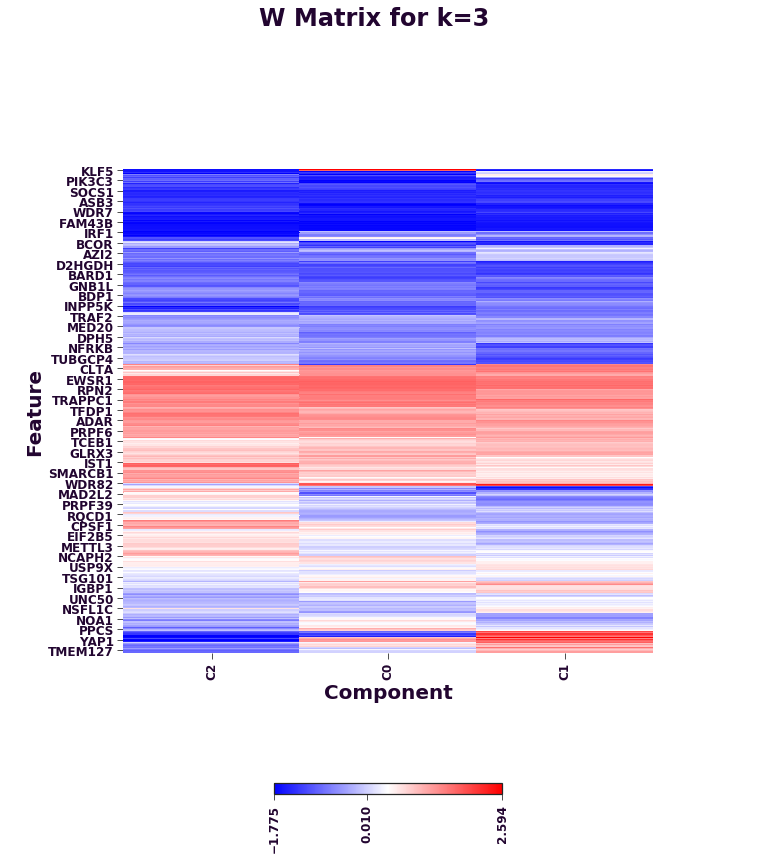

No handles with labels found to put in legend.
No handles with labels found to put in legend.


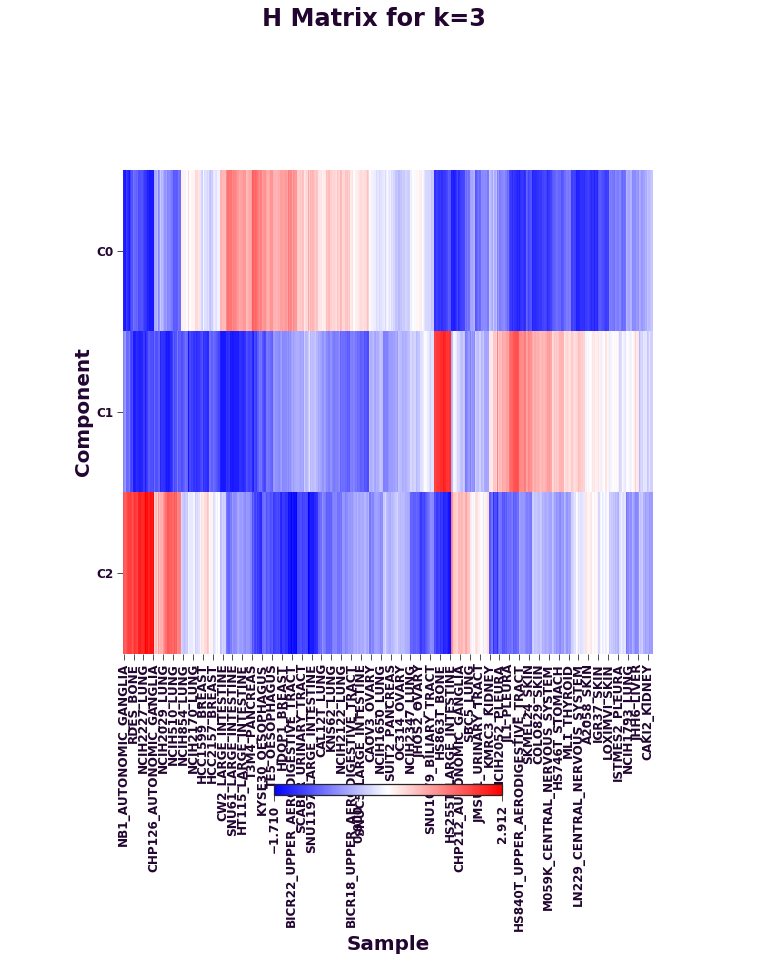

In [9]:
ccal.plot_nmf(w_matrix, h_matrix)

### 6. Compare the NMF components with each other using the information coefficient
This computation generates an association matrix that compares the component profiles against each other using the Information Coefficient. This is Fig S6A in the article and shows that the components are distinct.

Applying <function compute_information_coefficient at 0x7f0d719fb620> ...
	1/3 ...
	3/3 - done.


No handles with labels found to put in legend.


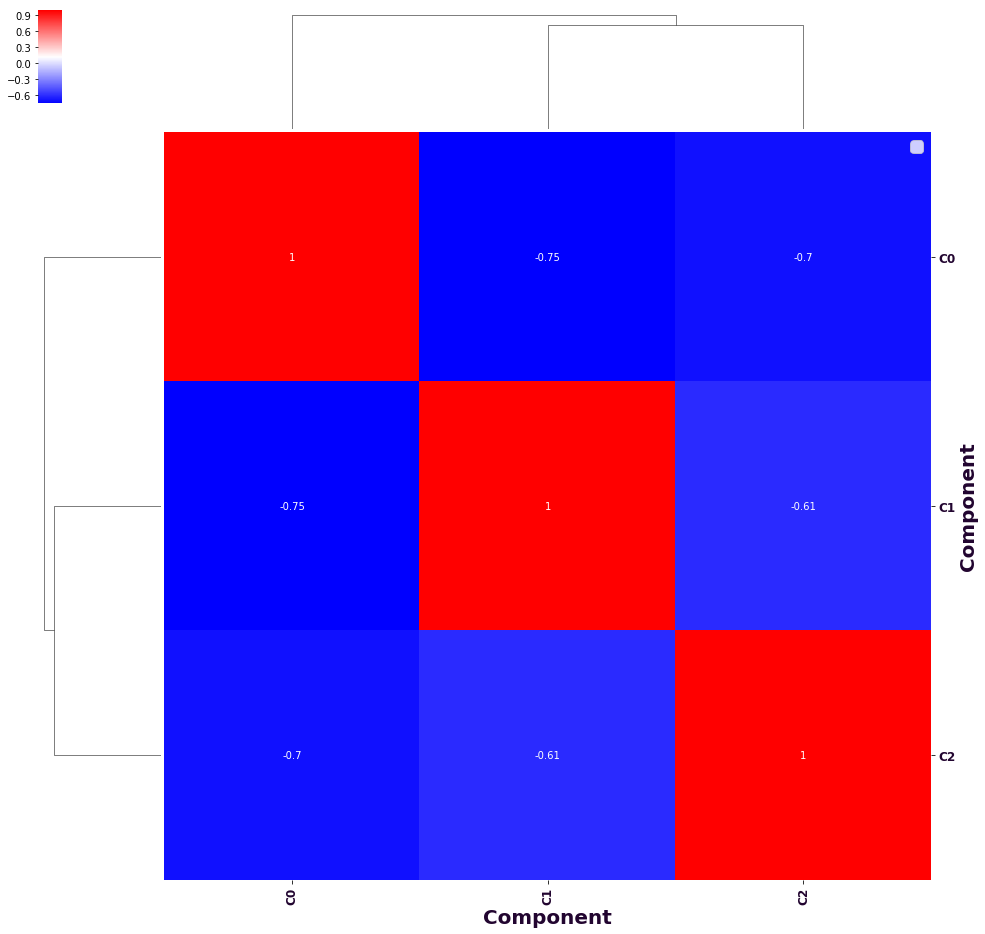

,C0,C1,C2
C0,0.999000,-0.753921,-0.695212
C1,-0.753921,0.995946,-0.609499
C2,-0.695212,-0.609499,0.997003


In [4]:
ccal.make_comparison_panel(
    h_matrix,
    h_matrix,
    axis=1,
    array_2d_0_name='Component',
    array_2d_1_name='Component')

### [Next chapter (4)](4 Annotate transcriptional components.ipynb) 

In [7]:
df = pd.read_table('B9991003.mbiogs.20190717.exp.cdc.tsv', index_col=0)
df = df.T
log = df.index.isin(rownm)
df = df[log]
df

row_id,B9991003 X00936b9285d6b8665ae9122993fb8e91,B9991003 X105622fadc33f23755ac2df823110aca,B9991003 Xe44f39747a8e84b02b4cb24659312144,B9991003 X293dd1284496215e9a0eca9f17a98e7e,B9991003 X01ed7190ce00862696edbf047b542045,B9991003 Xf4a6a5a1450a8448882e1c0aebc0eea5,B9991003 Xf7ee4a331a8fd70edc240dff978c170d,B9991003 Xcddbd4d01bc7513298a5135e97cfdb6b,B9991003 Xa57451efa2822becb256706fe939d078,B9991003 Xff8fbe2fe76c82d429d4fa1d315f3b93,...,B9991003 Xa7d2bd80340b4019986ea8d8c3638c75,B9991003 Xbc7a029dc7ce4b19a5a2b78a7b2fc6ae,B9991003 X13b911b56a330efd2660b67b1cf98466,B9991003 X9388bd484d0e404c6732573b4228d2a2,B9991003 Xc3d410d70dd7359baa40126494fb6765,B9991003 X50772aa64efb859960b20f8801cd6f58,B9991003 X91bcd3067a1a7954692d836515e04869,B9991003 Xc7439a06ffa32b313b0ec1b987b992a2,B9991003 X21a6043653d187f8bbead475d2f49791,B9991003 Xa021f5de25a2ffa059870f059a65d075
AARS,7.57,6.73,7.15,7.28,8.07,6.44,7.29,8.64,7.49,7.85,...,7.91,6.65,7.32,7.52,6.98,7.10,7.05,8.57,7.76,7.64
ACACA,5.29,5.49,5.53,5.95,5.40,5.65,6.13,5.77,5.75,5.35,...,5.12,5.70,5.46,5.77,4.68,5.07,5.36,6.21,5.35,5.31
ACTA2,10.42,7.79,9.56,9.07,10.07,7.95,8.89,8.66,8.82,10.09,...,8.68,9.15,10.82,9.16,7.26,10.34,9.26,7.69,9.54,10.60
ACTR5,3.18,2.17,3.84,4.21,3.66,3.10,3.51,2.79,3.15,3.86,...,4.14,3.32,3.00,1.95,3.49,3.39,3.57,3.45,2.92,3.52
ADAR,7.83,7.52,7.74,8.15,7.91,8.04,8.13,7.86,8.11,8.18,...,7.67,8.04,7.77,7.75,8.68,7.71,8.00,7.79,7.90,7.88
AHCY,6.24,6.37,6.05,5.73,6.30,6.75,5.69,6.70,6.18,6.21,...,6.32,6.80,6.28,6.40,7.06,6.52,5.83,7.19,5.85,6.80
ANAPC13,4.51,3.32,3.79,4.28,4.58,4.02,4.52,4.76,4.95,3.98,...,4.00,4.11,4.78,5.25,5.66,4.91,4.11,4.01,4.71,4.46
ANKRD35,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,...,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
ARID4A,5.73,5.71,6.10,5.79,6.13,5.28,6.29,5.36,6.18,6.08,...,5.68,4.20,6.17,5.99,6.53,6.43,5.43,5.82,6.40,5.33
ARIH1,6.54,6.09,6.45,6.33,6.26,6.87,6.65,6.49,6.76,6.64,...,6.11,5.80,6.56,6.95,7.13,6.82,6.58,6.22,6.70,6.16


In [10]:
h_pred = np.linalg.pinv(w_matrix[w_matrix.index.isin(list(df.index))]).dot(df)
h_pred_df = pd.DataFrame(h_pred, index=['C0', 'C1', 'C2'], columns=df.columns)
h_pred_df.to_csv('h_clinicaldown.txt', sep='\t')
h_pred_df

row_id,B9991003 X00936b9285d6b8665ae9122993fb8e91,B9991003 X105622fadc33f23755ac2df823110aca,B9991003 Xe44f39747a8e84b02b4cb24659312144,B9991003 X293dd1284496215e9a0eca9f17a98e7e,B9991003 X01ed7190ce00862696edbf047b542045,B9991003 Xf4a6a5a1450a8448882e1c0aebc0eea5,B9991003 Xf7ee4a331a8fd70edc240dff978c170d,B9991003 Xcddbd4d01bc7513298a5135e97cfdb6b,B9991003 Xa57451efa2822becb256706fe939d078,B9991003 Xff8fbe2fe76c82d429d4fa1d315f3b93,...,B9991003 Xa7d2bd80340b4019986ea8d8c3638c75,B9991003 Xbc7a029dc7ce4b19a5a2b78a7b2fc6ae,B9991003 X13b911b56a330efd2660b67b1cf98466,B9991003 X9388bd484d0e404c6732573b4228d2a2,B9991003 Xc3d410d70dd7359baa40126494fb6765,B9991003 X50772aa64efb859960b20f8801cd6f58,B9991003 X91bcd3067a1a7954692d836515e04869,B9991003 Xc7439a06ffa32b313b0ec1b987b992a2,B9991003 X21a6043653d187f8bbead475d2f49791,B9991003 Xa021f5de25a2ffa059870f059a65d075
C0,2.530748,2.281451,2.261249,2.249601,2.600444,2.211621,2.361600,2.277301,2.457940,2.480750,...,2.527818,2.045887,2.296374,2.632671,2.272393,2.494388,2.260542,2.407466,2.773159,2.180869
C1,2.017238,1.753435,2.257762,2.242855,1.994397,2.250625,2.191377,2.138773,2.127719,2.160493,...,2.007363,2.210430,2.117487,2.120434,2.205032,2.145255,2.224838,1.935917,2.051075,2.151973
C2,3.549805,3.270599,3.699277,3.727880,3.589551,3.655698,3.814634,3.643409,3.647999,3.789919,...,3.704638,3.586338,3.847561,3.464270,3.768349,3.603633,3.754650,3.969434,3.573473,3.750114


In [9]:
w_pred_df = df.dot(np.linalg.pinv(h_pred))
w_pred_df.columns = ['C0', 'C1', 'C2']
w_pred_df

,C0,C1,C2
AARS,0.911537,0.718778,1.004725
ACACA,0.793185,0.669102,0.623265
ACTA2,0.838459,0.032926,2.052773
ACTR5,0.172607,-0.187908,0.886526
ADAR,0.964276,1.044173,0.943084
AHCY,0.841068,0.314374,0.993206
ANAPC13,0.416809,0.661984,0.533653
ANKRD35,0.042698,-0.294906,0.157995
ARID4A,0.920545,0.927049,0.427948
ARIH1,0.966947,1.064646,0.527879


No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 1152x1152 with 0 Axes>

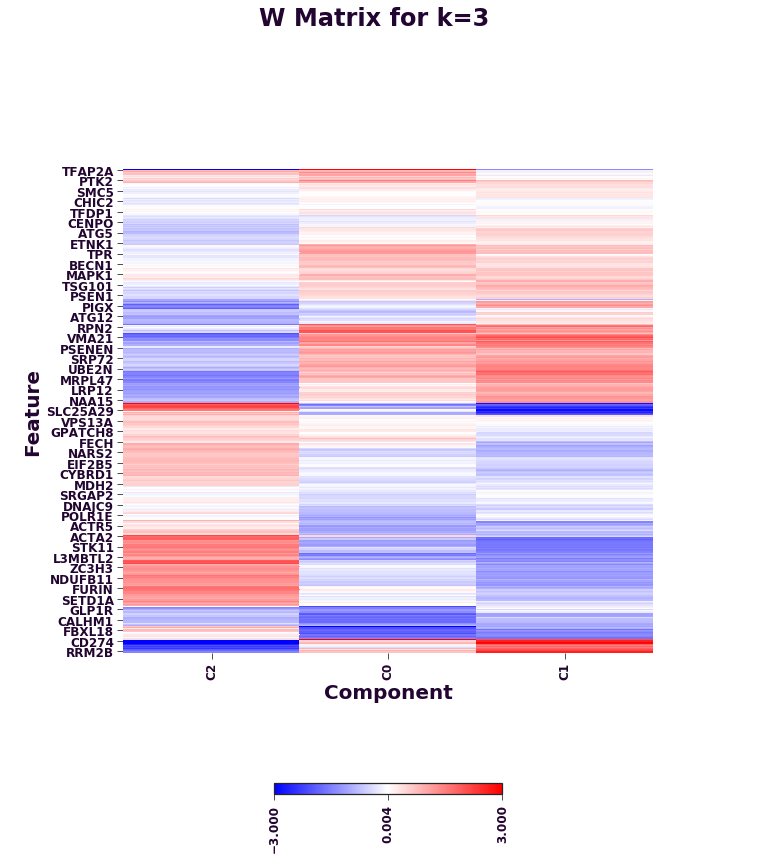

No handles with labels found to put in legend.
No handles with labels found to put in legend.


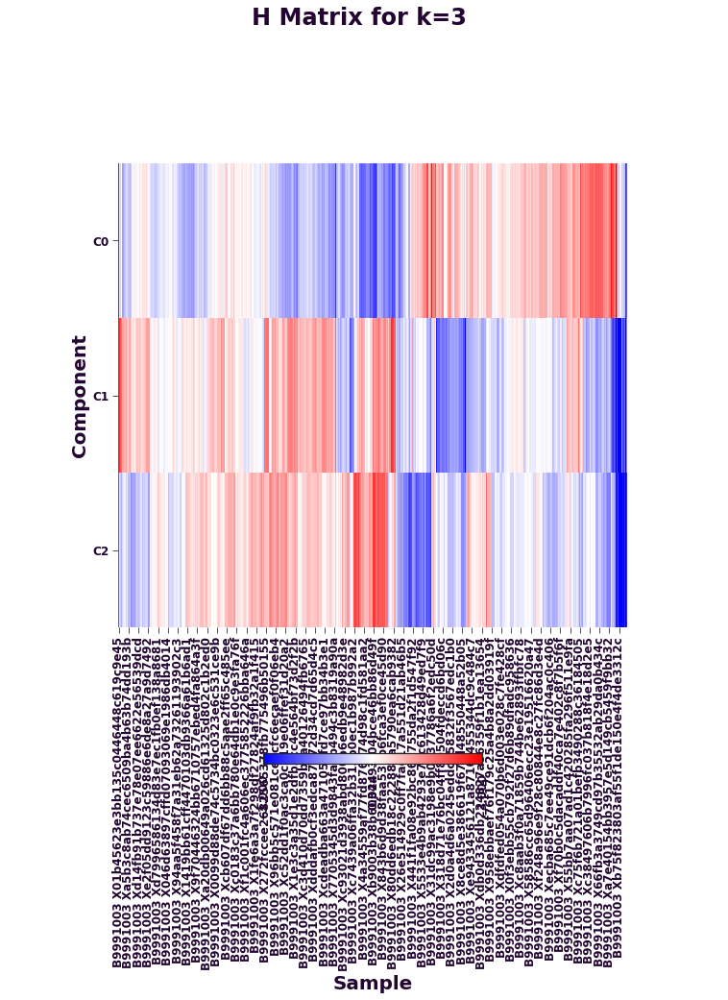

In [22]:
ccal.plot_nmf(w_pred_df, h_pred_df)